
# <span style="color:rgb(213,80,0)">Segundo examen parcial semestre 2025\-2</span>

### **Fecha de entrega: 28 de mayo de 2025**
### **Grupo:** 1
### **Profesor:** Erik Peña Medina
###  **Semestre:** 2025\-2
## Integrantes:
-  Cortez Peralta Rafael
-  Hernández Reyes Luis Fernando
## Resumen

Se presenta el desarrollo de una trayectoria para llevar al robot SCARA desde un punto P1 hasta un punto P2, utilizando en particular, una aproximación de tipo bang\-bang, que se caracteriza por tomar siempre su valor máximo o mínimo de las aceleraciones permitida, realizando un tipo de función cuadrática.


Se evaluará dicha trayectoria mediante el índice de manipulabilidad, calculado a partir del jacobiano de la cinemática previamente desarrollada en un trabajo anterior.


Se presenta el modelo cinemático inverso del robot SCARA, puesto que este nos ayudara a definir las posiciones de las articulaciones para llegar a los puntos de interés definidos. El comportamiento de las articulaciones se visualizara de manera grafica en un entorno tridimensional a través de ROS, utilizando el espacio virtual construido en clase.

## Contenido
-  Introducción
-  Descripción del problema
-  Propuesta de solución
-  Experimentos o simulaciones
-  Resultados
-  Conclusiones
## Introducción

La planificación de trayectorias constituye un pilar fundamental en la optimización del rendimiento y la funcionalidad de robots industriales avanzados y en diversas aplicaciones de automatización. El propósito principal de la generación de trayectorias es definir los comandos de control que guían a un robot, en este caso un manipulador SCARA, hacia una pose deseada logrando así que su efector final siga una ruta específica y sea capaz de cumplir alguna tarea en el camino.


La planificación de trayectorias debe garantizar el cumplimiento de las restricciones de las articulaciones del manipulador (límites de posición, velocidad y aceleración), así como a las restricciones dinámicas del sistema (inercia y par). A su vez, la planificación de trayectorias puede hacerse para diversos enfoques y depende de lo que se pretende lograr con el comportamiento del robot. Uno de los enfoques es cuando se busca la eficiencia temporal, es decir, minimizar el tiempo total de ciclo para lograr movimientos rápidos, esto se consigue al explotar al máximo los límites cinemáticos del robot. Otro enfoque es la precisión del movimiento en donde se buscan perfiles de velocidad y aceleración continuos para prevenir vibraciones, reducir el desgaste del equipo y mantener la precisión de posicionamiento.


Uno de los retos principales en el diseño de trayectorias es la búsqueda de la eficiencia temporal en conjunto con la precisión del movimiento, pues resulta difícil conseguirlo ya que una mayor velocidad de movimiento impulsa a los eslabones que conforman al robot a operar en los límites de sus capacidades de aceleración lo que trae como consecuencia discontinuidades en la aceleración que se traducen en vibraciones de la estructura del robot disminuyendo la precisión de posicionamiento, un aumento del desgaste de los componentes y, en algunos casos, daños al robot. Es por ello por lo que la planificación de trayectorias busca un equilibrio óptimo entre la velocidad de ejecución, la preservación de la precisión y durabilidad del robot.

## Descripción del problema

La trayectoria "Bang\-Bang Parabolic Blend" es fundamental en la teoría de control, se caracteriza por su cambio súbito durante la trayectoria. Un controlador "bang\-bang" es un tipo de controlador de retroalimentación que alterna de manera instantánea entre dos estados extremos de una señal de control y se asemeja a un sistema "on\-off". Para sistemas dinámicos simplificados, la solución de control óptimo implica dos "bangs". Esto significa que se aplica una aceleración extrema durante intervalos de tiempo acotados.


A pesar de su eficiencia teórica en la minimización del tiempo, la implementación física del control "bang\-bang" conlleva importantes implicaciones prácticas y puede presentar complicaciones, un ejemplo es que al tener una señal de control discontinua puede generar una señal de error oscilante alrededor del punto de ajuste deseado; también, los cambios abruptos en la señal de control pueden provocar fenómenos físicos como picos elevados de corriente eléctrica, calentamiento súbito del robot y con ello la expansión térmica de componentes metálicos.

## Propuesta de solución

Las trayectorias "bang\-bang" se construyen a partir de la intersección de las parábolas que se producen cuando existe la aplicación de una aceleración constante hasta un punto crítico en el cual se debe aplicar una desaceleración que nos permita llegar al punto de interés con precisión con respecto a la posición del efector final, lo que permite visualizar los segmentos de aceleración y deceleración máximas que componen la trayectoria óptima.

## Hipótesis

Existe una trayectoria "bang\-bang" en el espacio de trabajo del robot que nos permite  llegar de un punto $P_1$ a un punto $P_2$ ,  que permita a un robot SCARA mantener su capacidad de maníulabilidad en un valor alto, a lo largo de la trayectoria realizada y que la aceleración como la velocidad evolucionen de forma suave y continua, evitando cambios abruptos que puedan comprometer la estabilidad mecánica del sistema.

## Objetivo

Diseñar una trayectoria de mezcla parabólica tipo "bang\-bang" que permita a un robot scara mover un objeto de un punto $P_1$ a un punto $P_2$ , manteniendo su índice de manipulabilidad (w) dentro de un rango de 0.7 a 1 el mayor tiempo posible de la simulación.

## Metas
-  Plantear el modelo cinemático directo e inverso del robot SCARA.
-  Determinar el tipo de trayectoría parámetrizada a utilizar.
-  Establecer los parámetros del robot y lugar geometrico de la trayectoría (fijos).
-  Definir los parámetros de simulación (variables).
-  Calcular el índice de manipulabilidad.
-  Realizar la simulación del robot.
-  Analizar los resultados obtenidos.
-  Conclusiones.
## Planteamiento del modelo cinemático del robot
### Funciones

La transformación homogénea general que describe al robot SCARA es la siguiente:


$$^i T_j =\left(\begin{array}{cccc} \cos \left({{\mathrm{a}\mathrm{i}}}_j \right)\,\cos \left({{\mathrm{b}\mathrm{i}}}_j \right) & \cos \left({{\mathrm{a}\mathrm{i}}}_j \right)\,\sin \left({{\mathrm{b}\mathrm{i}}}_j \right)\,\sin \left({{\mathrm{g}\mathrm{i}}}_j \right)-\cos \left({{\mathrm{g}\mathrm{i}}}_j \right)\,\sin \left({{\mathrm{a}\mathrm{i}}}_j \right) & \sin \left({{\mathrm{a}\mathrm{i}}}_j \right)\,\sin \left({{\mathrm{g}\mathrm{i}}}_j \right)+\cos \left({{\mathrm{a}\mathrm{i}}}_j \right)\,\cos \left({{\mathrm{g}\mathrm{i}}}_j \right)\,\sin \left({{\mathrm{b}\mathrm{i}}}_j \right) & x_{i,j} \newline \cos \left({{\mathrm{b}\mathrm{i}}}_j \right)\,\sin \left({{\mathrm{a}\mathrm{i}}}_j \right) & \cos \left({{\mathrm{a}\mathrm{i}}}_j \right)\,\cos \left({{\mathrm{g}\mathrm{i}}}_j \right)+\sin \left({{\mathrm{a}\mathrm{i}}}_j \right)\,\sin \left({{\mathrm{b}\mathrm{i}}}_j \right)\,\sin \left({{\mathrm{g}\mathrm{i}}}_j \right) & \cos \left({{\mathrm{g}\mathrm{i}}}_j \right)\,\sin \left({{\mathrm{a}\mathrm{i}}}_j \right)\,\sin \left({{\mathrm{b}\mathrm{i}}}_j \right)-\cos \left({{\mathrm{a}\mathrm{i}}}_j \right)\,\sin \left({{\mathrm{g}\mathrm{i}}}_j \right) & y_{i,j} \newline -\sin \left({{\mathrm{b}\mathrm{i}}}_j \right) & \cos \left({{\mathrm{b}\mathrm{i}}}_j \right)\,\sin \left({{\mathrm{g}\mathrm{i}}}_j \right) & \cos \left({{\mathrm{b}\mathrm{i}}}_j \right)\,\cos \left({{\mathrm{g}\mathrm{i}}}_j \right) & z_{i,j} \newline 0 & 0 & 0 & 1 \end{array}\right)$$

A partir de ella podemos plantear el modelo cinemático del robot.

### Modelo cinemático directo de la postura:

Describe cómo se relacionan las configuraciones internas del robot (ángulos entre los eslabones) con la posición y orientación del robot en el espacio.


$$^0 T_p =\left(\begin{array}{cccc} \cos \left(\theta_{1,2} +\theta_{2,3} +\theta_{O,1} \right) & -\sin \left(\theta_{1,2} +\theta_{2,3} +\theta_{O,1} \right) & 0 & x_{O,1} +L_2 \,\cos \left(\theta_{1,2} +\theta_{O,1} \right)+L_1 \,\cos \left(\theta_{O,1} \right)+L_3 \,\cos \left(\theta_{1,2} +\theta_{2,3} +\theta_{O,1} \right)\newline \sin \left(\theta_{1,2} +\theta_{2,3} +\theta_{O,1} \right) & \cos \left(\theta_{1,2} +\theta_{2,3} +\theta_{O,1} \right) & 0 & y_{O,1} +L_2 \,\sin \left(\theta_{1,2} +\theta_{O,1} \right)+L_1 \,\sin \left(\theta_{O,1} \right)+L_3 \,\sin \left(\theta_{1,2} +\theta_{2,3} +\theta_{O,1} \right)\newline 0 & 0 & 1 & 0\newline 0 & 0 & 0 & 1 \end{array}\right)$$

El vector de pose contiene las variables más importantes de la matriz de transformaciones, lo que permite describir el estado de todo el sistema con la posición del punto p y las variables que intervienen en la orientación de las juntas.


$$^0 \xi_p =\left(\begin{array}{c} x_{O,1} +L_2 \,\cos \left(\theta_{1,2} +\theta_{O,1} \right)+L_1 \,\cos \left(\theta_{O,1} \right)+L_3 \,\cos \left(\theta_{1,2} +\theta_{2,3} +\theta_{O,1} \right)\newline y_{O,1} +L_2 \,\sin \left(\theta_{1,2} +\theta_{O,1} \right)+L_1 \,\sin \left(\theta_{O,1} \right)+L_3 \,\sin \left(\theta_{1,2} +\theta_{2,3} +\theta_{O,1} \right)\newline \theta_{1,2} +\theta_{2,3} +\theta_{O,1}  \end{array}\right)$$
## Descripción del experimento

El desarrollo de este segundo examen parcial está centrado en la implementación de una trayectoria en un manipulador serial 3R en un entorno tridimensional bajo ROS, cuyo análisis y planteamiento durante el semestre representó múltiples retos para el modelado geométrico, análisis cinemático y simulación robótica. A partir de la definición estructural en URDF, se estableció un modelo virtual para la configuración articulada del robot, permitiendo su visualización y manipulación dentro de un entorno simulado.


Desarrollando los modelos matemáticos correspondientes a la cinemática directa de la postura y de las velocidades, logramos entender las relaciones funcionales entre el espacio articular y el espacio tridimensional. Asimismo, al resolver la cinemática inversa logramos calcular las configuraciones articulares necesarias para alcanzar una posición deseada del efector final, validando los resultados mediante una simulación dinámica. Aplicando el control de movimiento en las articulaciones se busca demostrar la viabilidad de la solución propuesta la cual se desarrolló a partir de la trayectoria mezcada parabólica "bang\-bang" presentada en el artículo  *"OPTIMUM TRAJECTORY FUNCTION FOR  MINIMUM  ENERGY REQUIREMENTS OF A SPHERICAL ROBOT"* \[4\]. Para la trayectoria a desarrollar se utilizan dos funciones las cuales son válidas únicamente en un rango de tiempo establecido a partir del tiempo de simulación concurrido y el tiempo de simulación total; las funciones que definen la trayectoria a evaluar son:

### $P(t)=P_0 +\frac{2\cdot t^2 }{t_f ^2 }\cdot (P_f -P_0 )$ ,   válida cuando   $0\le t\le \frac{t_f }{2}$
### $P(t)=P_0 +\frac{2\cdot t^2 }{t_f ^2 }\cdot (P_f -P_0 )$ ,   válida cuando   $0\le t\le \frac{t_f }{2}$

Para la simulación del robot se busca que el efector final pase de un punto $P_1$ a un punto $P_2$ , para ello se definen los siguientes parámetros fijos del robot:

-  $\displaystyle L_1 =0.5\,[m]$
-  $\displaystyle L_2 =0.5\,[m]$
-  $\displaystyle L_3 =0.3\,[m]$

Los puntos $P_1$ y $P_2$ están definidos por:


 $P_1$ :

-  $\displaystyle x_{in} =0.4\,[m]$
-  $\displaystyle y_{in} =-0.1\,[m]$

 $P_2$ :

-  $\displaystyle x_{fin} =0.0\,[m]$
-  $\displaystyle y_{fin} =-1.3\,[m]$

Además, los parámetros de trayectoria son aquellos que cambian con el paso del tiempo, uno de ellos es la posición del efector final en $P_1$ y $P_2$ está dada por:


En $P_1$ :

-  $\displaystyle ^p \theta_{in} =\frac{\pi }{2}\,[rad/s]$

En $P_2$ :

-  $\displaystyle ^p \theta_{fin} =-\frac{\pi }{2}\,[rad/s]$

Para la simulación se propone el tiempo de total de simulación ( $t_f$ ) y el intervalo de tiempo en el que se realiza cada cambio ( $t_{in}$ ), mientras más corto sea el intervalo la simulación es más fluida:

-  $\displaystyle t_f =20\,[seg]$
-  $\displaystyle t_{in} =0.1\,[seg]$

Con esto podemos asegurar que el cálculo de la cinemática del robot durante la simulación se realizará durante un intervalo de tiempo $0\,[seg]\le t\le 20\,[seg]$ en intervalos de $0.1\,[seg]$ , es decir, realizará 200 veces dicho cálculo.


A partir de los parámetros se define el lugar geométrico de trayectoria:

<center>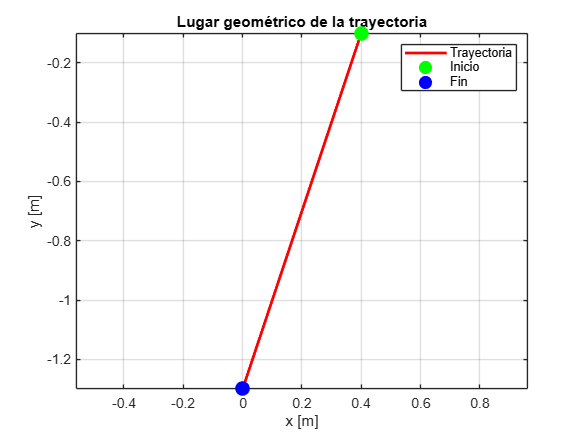</center>

## Solución de la cinemática inversa.

Para calcular el índice de manipulabilidad es necesario definir la cinemática inversa de la postura, ya que tenemos una configuración deseada, definda por los puntos $P_1$ y $P_2$ .


Para determinar la configuracion del Scara, se utilizan las leyes de cosenos, de senos y el teorema de Pitágoras.

<p style="text-align:left">
   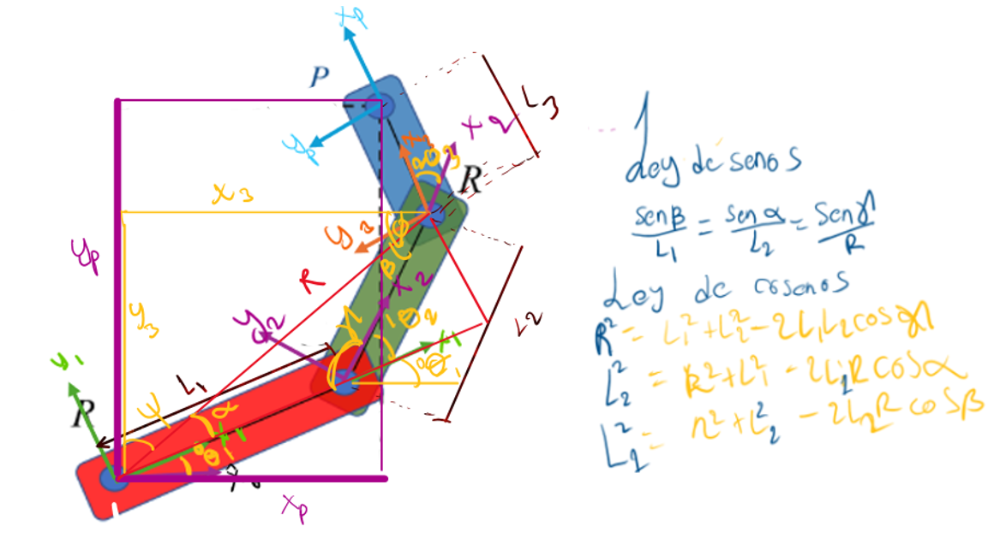
</p>



Utilizando el teorema de Pitágoras, es posible determinar la magnitud del vector R, que representa la distancia entre el sistema 1 y el sistema 2 del triángulo formado por las longitudes de los eslabones.

\matlabheadingthree{
$$R=\sqrt{x_3 ^2 -y_3 ^2 }$$}

Para sacar el valor de theta\_1\_2, se puede ver que el valor de gamma está estrechamente relacionado, ya que la suma de los dos ángulos da Pi, en consecuencia:

\matlabheadingthree{
$$\theta_2 =\pi -acos\,\left(\frac{R^2 -L_1 ^2 -L_2 ^2 }{2\cdot L_1 \cdot L_2 }\right)$$}

Para encontrar la expresión de $^0 \theta_1$ se calcula el ángulo alfa ( $\alpha$ ) y Psi ( $\psi$ ).

<p style="text-align:left">
   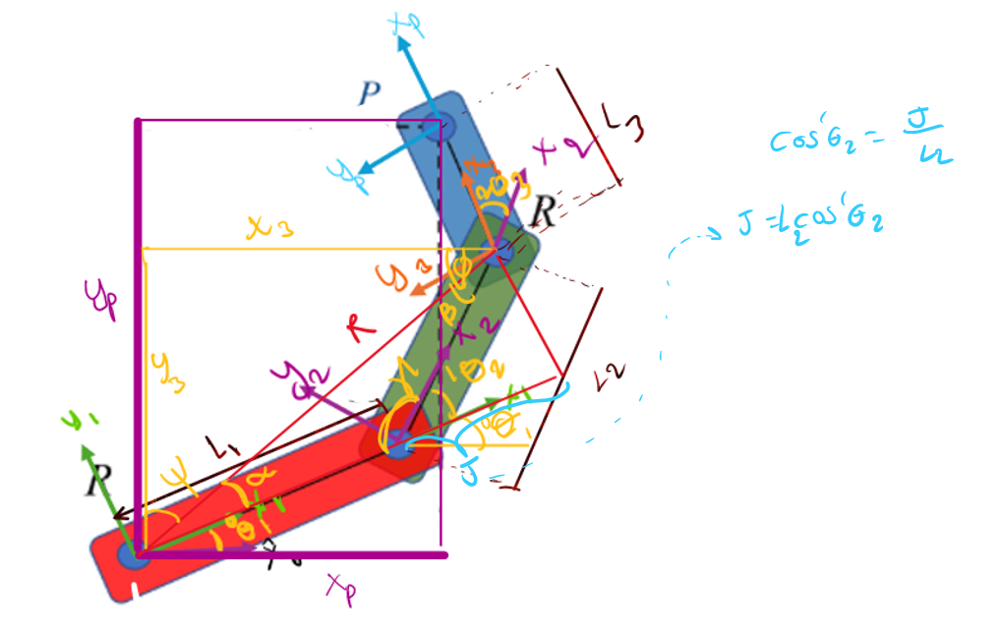
</p>


Para alfa ( $\alpha$ ) se utiliza el triángulo rectángulo formado por el sistema de coordenadas uno y tres que pasa por el sistema dos. Para ello se emplea la definición de coseno. Este concepto se ocupa en triángulo pequeño y luego en el grande.


$$\begin{array}{l} {cos(alfa)=\frac{L_1 +L_2 \cos \left(\theta_{1,2} \right)}{\sqrt{{\left(L_2 \cos \left(\theta_{1,2} +\theta_{O,1} \right)+L_1 \cos \left(\theta_{O,1} \right)\right)}^2 +{\left(L_2 \sin \left(\theta_{1,2} +\theta_{O,1} \right)+L_1 \sin \left(\theta_{O,1} \right)\right)}^2 }}}\,\newline alafa={\mathrm{a}\mathrm{c}\mathrm{o}\mathrm{s}}\left(\frac{L_1 +L_2 \cos \left(\theta_{1,2} \right)}{\sqrt{{\left(L_2 \cos \left(\theta_{1,2} +\theta_{O,1} \right)+L_1 \cos \left(\theta_{O,1} \right)\right)}^2 +{\left(L_2 \sin \left(\theta_{1,2} +\theta_{O,1} \right)+L_1 \sin \left(\theta_{O,1} \right)\right)}^2 }}\right) \end{array}$$

Para encontrar el ángulo ∅, se aplica el mismo procedimiento utilizando el triángulo formado por los vectores x3 y y3.

<p style="text-align:left">
   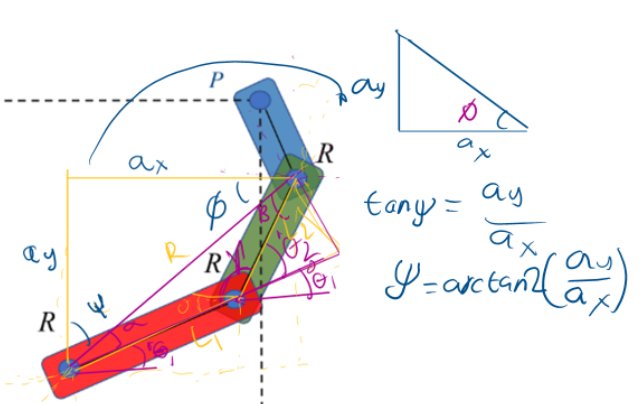
</p>


Donde $x_3 =a_x$ y $y_3 =a_y$


Se utiliza la función atan2, ya que permite obtener soluciones en los cuatro cuadrantes del plano cartesiano. Por ende es útil para garantizar que cualquier posición tenga una solución válida.


Utilizando la imagen como guía , se observa que el ángulo ψ es igual a la suma de los ángulos θ\_0\_1 y α. Por lo tanto, se tiene la siguiente relación:


$$\phi =\theta_{0,1} +\alpha$$

De esta expresión se puede despejar theta\_O\_1


$$\theta_{0,1} =\phi -\alpha$$
## Índice de manipulabilidad

El índice de manipulabilidad es una medida que cuantifica la capacidad del robot para seguir una trayectoria desde una determinada configuración articular definida por sus parámetros fijos. Se utiliza principalmente para evaluar la cercanía a posiciones singulares y la calidad de la capacidad de movimiento del efector final. El índice de manipulabilidad se obtiene a través de la matriz jacobiana del robot. Se representa con la letra w y se calcula de la siguiente manera, cundo la matriz no es cuadrada:

\matlabheadingtwo{
$$w=\sqrt{det(J\,J^T \,)}/w_{max}$$}

Sin embargo, nuestro análisis muestra una matriz cuadrada por ende el índice de manipulabilidad se calcularía de la siguiente forma:

\matlabheadingtwo{
$$w=\det (J\,)/w_{max}$$}

Para evaluar el índice de manipulabilidad se realzian las siguientes consideraciones:

-  Si $w\,\to \,0$ : El robot está en una **configuración singular**.
-  Si $w\,\to \,1$ : El robot puede moverse "bien" en muchas direcciones, lejos de singularidades.

Para el robot SCARA el índice de manipulabilidad se puede evaluar a partir del cambio de la posición angular $^1 \theta_2$ y se obtiene de la siguiente manera:

\matlabheadingtwo{
$$w=\frac{L_1 \,L_2 \,cos\left(^1 \theta_2 \right)}{L_1 \,L_2 }$$}
## Resultados

La simulación se realizó en ROS Visualization el cual es una herramienta de visualización 3D para el sistema operativo Robot Operating System. Se utilizó para visualizar lo que hace y percibe el robot SCARA en tiempo real. El código que ejecuta la trayectoria propuesta se realizó bajo el lenguaje de programación de Python y es el siguiente:


\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-


\#!/usr/bin/env python3


import rclpy


from rclpy.node import Node


from trajectory\_msgs.msg import JointTrajectory, JointTrajectoryPoint


from builtin\_interfaces.msg import Duration


import time


from math import atan2, acos, cos, sin, sqrt, pow, pi


class ScaraTrayectory(Node):


&nbsp;&nbsp;&nbsp;&nbsp; def \_\_init\_\_(self):


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; super().\_\_init\_\_("scara\_trayectory\_node")


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; self.x\_in = 0.4


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; self.y\_in = \-0.1


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; self.theta\_P\_in = pi/2


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; self.x\_fin = 0.0


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; self.y\_fin = \-1.3


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; self.theta\_P\_fin = \-pi/2


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; self.total\_trajectory\_time = 20.0 \# segundos


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; self.timer\_period = 0.1 \# segundos


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; self.lambda\_ = 0.0


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; topic\_name = "/scara\_trajectory\_controller/joint\_trajectory"


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; self.trayectory\_publisher\_ = self.create\_publisher(JointTrajectory,


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; topic\_name, 10)


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; self.joints\_ = \['link\_1\_joint', 'link\_2\_joint', 'link\_3\_joint'\]


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; self.timer\_ = self.create\_timer(self.timer\_period, self.timer\_callback)


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; self.get\_logger().info('Robot SCARA ejecutando trayectoria...')


&nbsp;&nbsp;&nbsp;&nbsp; def timer\_callback(self):


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; trajectory\_msg = JointTrajectory()


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; trajectory\_msg.joint\_names = self.joints\_


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; point = JointTrajectoryPoint()


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; solution = ink\_sol(self.lambda\_, self.x\_in, self.y\_in, self.theta\_P\_in, self.x\_fin, self.y\_fin, self.theta\_P\_fin, self.total\_trajectory\_time)


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; point.positions = solution


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; point.time\_from\_start = Duration(sec=1)


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; trajectory\_msg.points.append(point)


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; self.trayectory\_publisher\_.publish(trajectory\_msg)


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; self.get\_logger().info(f'Ejecución de trayectoria: {solution}')


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; self.lambda\_ += self.timer\_period


def ink\_sol(lambda\_, x\_in, y\_in, theta\_P\_in, x\_fin, y\_fin, theta\_P\_fin, t\_total):


&nbsp;&nbsp;&nbsp;&nbsp; if lambda\_ <= t\_total:


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; L\_1 = 0.5


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; L\_2 = 0.5


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; L\_3 = 0.3


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; if lambda\_ <= t\_total / 2:


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; xp = x\_in + (2 \* (lambda\_ / t\_total)\*\*2) \* (x\_fin \- x\_in)


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; yp = y\_in + (2 \* (lambda\_ / t\_total)\*\*2) \* (y\_fin \- y\_in)


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; theta\_P = theta\_P\_in + (2 \* (lambda\_ / t\_total)\*\*2) \* (theta\_P\_fin \- theta\_P\_in)


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; else:


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; xp = x\_fin + ((4 \* (lambda\_ / t\_total) \- 2 \* (lambda\_ / t\_total)\*\*2) \- 2) \* (x\_fin \- x\_in)


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; yp = y\_fin + ((4 \* (lambda\_ / t\_total) \- 2 \* (lambda\_ / t\_total)\*\*2) \- 2) \* (y\_fin \- y\_in)


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; theta\_P = theta\_P\_fin + ((4 \* (lambda\_ / t\_total) \- 2 \* (lambda\_ / t\_total)\*\*2) \- 2) \* (theta\_P\_fin \- theta\_P\_in)


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; x\_3 = xp \- L\_3 \* cos(theta\_P)


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; y\_3 = yp \- L\_3 \* sin(theta\_P)


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; link\_2\_joint = acos((pow(x\_3, 2) + pow(y\_3, 2) \- pow(L\_1, 2) \- pow(L\_2, 2))/(2\*L\_1\*L\_2))


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; beta = atan2(y\_3, x\_3)


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; psi = acos((pow(x\_3, 2) + pow(y\_3, 2) + pow(L\_1, 2) \- pow(L\_2, 2))/(2\*L\_1\*sqrt(pow(x\_3, 2) + pow(y\_3, 2))))


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; link\_1\_joint = beta \- psi


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; link\_3\_joint = theta\_P \- link\_1\_joint \- link\_2\_joint


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; return \[float(link\_1\_joint), float(link\_2\_joint), float(link\_3\_joint)\]


&nbsp;&nbsp;&nbsp;&nbsp; elif lambda\_ > t\_total:


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; link\_1\_joint = 0.0


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; link\_2\_joint = 0.0


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; link\_3\_joint = 0.0


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; return \[float(link\_1\_joint), float(link\_2\_joint), float(link\_3\_joint)\]


def main(args=None):


&nbsp;&nbsp;&nbsp;&nbsp; rclpy.init(args=args)


&nbsp;&nbsp;&nbsp;&nbsp; node = ScaraTrayectory()


&nbsp;&nbsp;&nbsp;&nbsp; rclpy.spin(node)


&nbsp;&nbsp;&nbsp;&nbsp; rclpy.shutdown()


if \_\_name\_\_ == "\_\_main\_\_":


&nbsp;&nbsp;&nbsp;&nbsp; main()


\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-\-

## **Simulación**

 **La trayectoria de mezcla parabólica "Bang\-Bang", como lo indica su definición, divide la trayectoria en dos movimientos parabólicos. Sabemos que la primera parte de su trayectoria se ejecuta durante los primeros 10 segundos de la simulación ya que así se definió en la metodología, durante los primeros 4 segundos (aproximadamente) el efector final se mueve rápidamente hacia el punto de inicio** $P_1$ para después reducir significativamente su velocidad de movimiento, con ello comprobamos una de las peculiaridades de éste método, pues al buscar un equilibrio entre la eficiencia temporal y la capacidad mecánica, el robot aprovecha el tiempo en el que no está realizando la trayectoria deseada para posicionarse rápidamente.

<p style="text-align:left">
   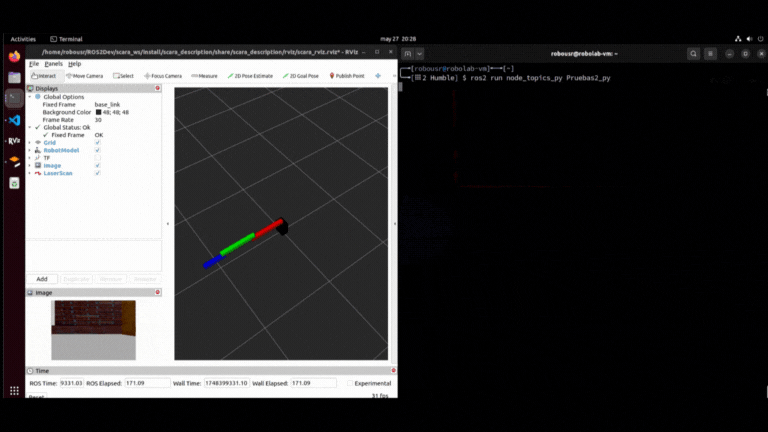
</p>


Resolución original en → [https://youtu.be/r89ndglwuaQ](https://youtu.be/r89ndglwuaQ)

## **Características de la trayectoria**

Desde la vista plana superior podemos verificar cómo es que el robot realiza la trayectoria mezclando en su recorrido dos parábolas, la primera que transcurre durante los primeros 10 segundos de la simulación, además de posicionar al efector final en el punto de partida ( $P_1$ ) también nos ayuda a realizar una trancisión suave y segura hacia la segunda parábola la cual podemos visualizar durante la segunda parte de la simulación. Durante la segunda parte de la simulación podemos ver como el efector final pasa del punto $P_1$ al $P_2$ realizando una leve trayectoria parabólica intentando mantener una velocidad constante lo que le permite aprovechar el mayor tiempo posible la capacidad mecámica del robot.

<p style="text-align:left">
   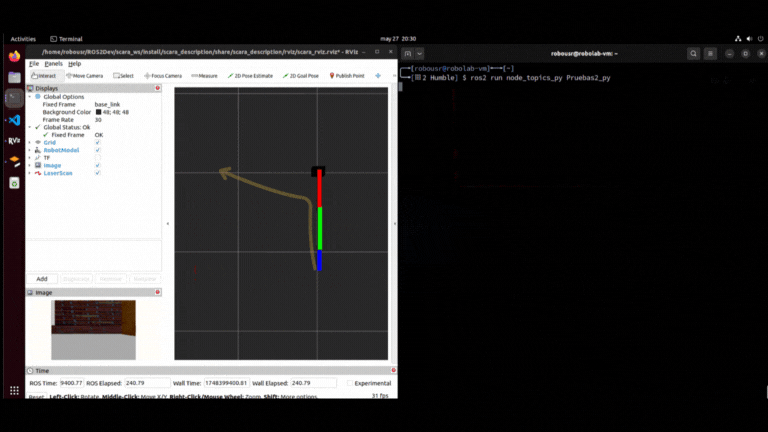
</p>


Resolución original en → [https://youtu.be/WmK7S7mPwbM](https://youtu.be/WmK7S7mPwbM)

### Gráficas

En la gráfica 1 se muestra el cambio de la posición angular de $^1 \theta_2$ en el tiempo, con ella es posible determinar si existen vibraciones o discontinuidades en la trayectoria lo que podría provocar fallos y daños durante el recorrido. En este caso podemos observar un cambio exponencial en el rango de tiempo $4\,[seg]<t<14\,[seg]$ , esto se debe a la transición entre las trayectorias parabólicas del método, durante la simulación fuera de ese rango temporal podemos notar que las trayectorias son prácticamente rectas.

<center>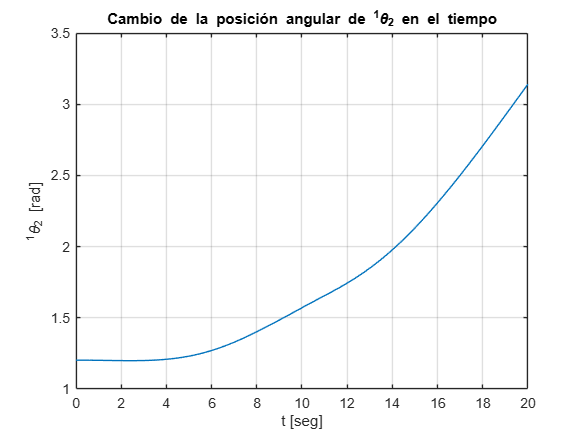</center>



En la gráfica 2 podemos observar el cambio del índice de manipulabilidad del robot al seguir la trayectoria definida, al principio podemos notar que se mantiene durante los primeros 4 segundos de simulación, transcurrido ese tiempo el índice de manipulabilidad aumenta hasta llegar al máximo a los 10 segundos, esto debido a la desaceleración brusca que sufre al transicionar entre las trayectorias parabólicas. Sin embargo, pasados los 10 segundos de simulación el índice de manipulabilidad comienza a decrecer hasta llegar a cero, esto se debe principalmente a la posición del punto $P_2$ ya que provoca que los tres eslabones del robot estén casi alineados lo que nos acerca a una singularidad, esto puede traer como consecuencias que la trayectoria se vuelva inestable lo que se traduce en movimientos violentos o mal definidos del robot provocando fallos si se realiza en la vida real.

<center>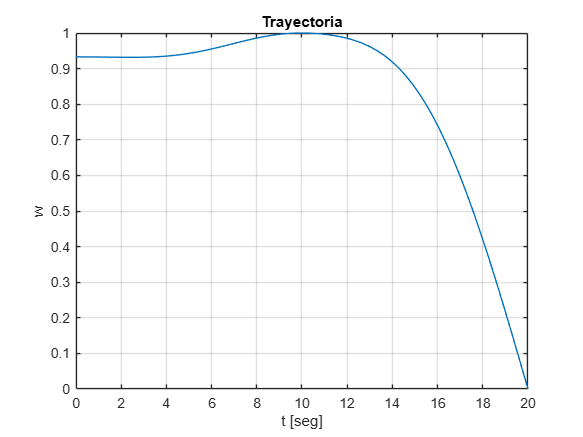</center>

## Conclusiones

El diseño e implementación de trayectorias es uno de los puntos más importantes a la hora de implementar un control a un robot, pues del correcto estudia y análisis depende que el robot pueda cumplir con las tareas deseadas evitando así fallos físicos y situaciones que pongan en peligro tanto al robot como a lo que lo rodea. Con la simulación de la implementación de una trayectoria de mezcla parabólica "Bang\-Bang" en el robot SCARA que hemos trabajado a lo largo del semestre pude apreciar el comportamiento del robot bajo los parámetros fijos y variables que definimos (como los puntos de partida y final así como los intervalos de tiempo y tiempo total de simulación) y cómo es que modificando estas configuraciones cambia el índice de manipulabilidad aunque el modelo de trayectoria siga siendo el mismo, de las diversas simulaciones realizadas elegimos una que nos permitiera analizar con mayor detalle las diversas situaciones en las que puede verse envuelto el robot. Los objetivos se cumplieron ya que para el rango establecido el índice de manipulabilidad se mantiene arriba del 0.7.


## Referencias

\[1\] G. B. Muniyandi, “Citation: Muniyandi GB (2024) In\-Depth Analysis of Kinematic, Dynamic, and Control Aspects of a 4\-Axis SCARA Robot Manipulator,” Int J Robot Eng, vol. 7, p. 37, 2024, doi: 10.35840/2631\-5106/4137.


\[2\] C. Feng, G. Gao, and Y. Cao, “Kinematic modeling and verification for a SCARA robot,” 2016.


\[3\] B. Fernini, “Dynamic Behavior of a SCARA Robot by using N\-E Method for a Straight Line and Simulation of Motion by using Solidworks and Verification by Matlab/Simulink,” International Journal of Robotics and Automation (IJRA), vol. 3, no. 4, pp. 221–233, 2014.


\[4\] S. A. Alshahrani, H. Diken, A. A. N Aljawi, S. Alshahrani, y A. Aljawi, “OPTIMUM TRAJECTORY FUNCTION FOR MINIMUM ENERGY REQUIREMENTS OF A SPHERICAL ROBOT”, 2002.

